In [122]:
import os
import sys
import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np
import geopandas as gpd
import seaborn as sns
from sklearn.cluster import DBSCAN, OPTICS
from HierarchicalGeoClustering import TreeClusters, Clustering 
from sklearn.preprocessing import StandardScaler
from scipy.spatial import cKDTree, Delaunay
import kneed
import shapely 
from matplotlib import cm
import pandas as pd
import warnings
import contextily as ctx
warnings.filterwarnings('ignore')

In [123]:
df_afternoon = gpd.read_file('../data/Afternoon/wd_d_11.shp')
df_evening = gpd.read_file('../data/Evening/wd_d_11.shp')

In [124]:
df_afternoon.head()

,id,uname,contenido,fecha,hora,geometry
0,6151577,CorbataCorbata,http://t.co/K8jPqPoteU,2015-01-20,03:04:42,POINT (-99.16654 19.43711)
1,6152073,dealucas777,http://t.co/tLJnjDU5OJ,2015-01-20,03:22:20,POINT (-99.14428 19.39481)
2,6149938,oscarra84365395,@ANGIECARIME1 que rica estas bb,2015-01-20,02:02:09,POINT (-99.10801 19.38911)
3,6149888,Otro_Dali,Tuiteando con el dentista,2015-01-20,02:00:02,POINT (-99.64388 19.27807)
4,6149890,trendinaliaMX,6. Manuel Velasco\n7. Gobernador de Chiapas\n8...,2015-01-20,02:00:06,POINT (-99.13290 19.43190)


In [125]:
df_evening.head()

,id,uname,contenido,fecha,hora,geometry
0,6158590,Monique_Can,No debo hablarle ð¢ð£,2015-01-20,07:17:49,POINT (-99.22080 20.22977)
1,6159223,hectorlgg,@7_Dizal http://t.co/fAyCMJe5S7,2015-01-20,07:36:36,POINT (-99.19952 19.39632)
2,6161972,GabyGoldsmith,Me estoy tratando de conectar,2015-01-20,08:50:26,POINT (-99.23697 19.42043)
3,6162569,Samy_James,Quiero un esquite ð½,2015-01-20,09:05:34,POINT (-99.24591 19.41519)
4,6163536,luna150701,@orrego_flor http://t.co/UQbILIM1OR,2015-01-20,09:28:33,POINT (-99.03399 19.40840)


In [126]:
df_manzanas = gpd.read_file('../data/manzanas_entropia_cdmx.zip')
df_Zonas_metro = gpd.read_file('../data/selection_sun.zip')
df_manzanas_500 = gpd.read_file('../data/entropia_manzanas_vecin_500m_2012.zip')

In [127]:
df_Zonas_metro.head()

,OBJECTID_1,OBJECTID,CVE_SUN,NOM_SUN,Shape_Leng,F75sum,F90sum,F00sum,F14sum,pop75_sum,pop90_sum,pop00_sum,pop15_sum,FIDt,Shape_Le_1,Shape_Area,IdText,Costa,geometry
0,27,27,C13_01,Actopan,0.482471,54.0,85.0,118.0,141.0,15470.806330,26050.479672,34442.095784,46452.604905,27,51714.978471,3.423416e+07,27,0.0,"POLYGON ((-307580.656 -2092507.653, -307576.62..."
1,28,28,C13_02,Apan,0.174622,8.0,16.0,27.0,38.0,12451.031133,19228.977129,23894.341176,28934.109030,28,18830.291717,5.393982e+06,28,0.0,"MULTIPOLYGON (((-258086.559 -2160344.183, -258..."
2,31,31,C13_05,Mixquiahuala-Progreso,0.250638,50.0,75.0,92.0,97.0,15404.153587,26655.441819,35694.871460,49516.516828,31,26826.174988,2.019812e+07,31,0.0,"POLYGON ((-332138.071 -2094643.784, -332062.07..."
3,32,32,C13_06,Ciudad Sahagún-Tepeapulco,0.292020,19.0,45.0,71.0,96.0,29279.603097,39157.189431,44051.750835,45828.177379,32,31462.148976,1.673282e+07,32,0.0,"POLYGON ((-267998.211 -2148097.300, -267854.21..."
4,33,33,C13_07,Tepeji de Ocampo,0.360248,32.0,60.0,92.0,105.0,13008.799362,24050.057598,33276.353674,48906.742084,33,38812.011352,1.671990e+07,33,0.0,"POLYGON ((-349063.176 -2130137.913, -349107.75..."


In [128]:
df_manzanas.head()

,OBJECTID,Join_Count,TARGET_FID,CVEGEO,VIV0,Sum_comerc,Sum_equipa,Sum_ocio,POLY_ID,VIV0_1,...,Sum_equi_1,Sum_ocio_1,entropia,CVEGEO_1,POB1,area_k,den_pop,Shape_Leng,Shape_Area,geometry
0,1,1,0,0900200010330001,135,41,14,1,1.0,0,...,0,0,-0.146761,0900200010330,2442,0.390182,6258.625263,4225.088737,304663.291856,"POLYGON ((481527.915 2154739.143, 481543.566 2..."
1,2,1,1,0900200011095024,345,17,0,0,2.0,0,...,0,0,-0.252390,0900200011095,6809,0.272188,25015.758060,1915.603242,36823.887236,"POLYGON ((477753.147 2154459.427, 477749.183 2..."
2,3,1,2,0900200011042015,151,15,0,0,3.0,0,...,0,0,-0.192210,0900200011042,6282,0.314789,19956.207809,1720.436110,77137.611334,"POLYGON ((478451.395 2153377.348, 478446.807 2..."
3,4,1,3,0900200011095025,62,12,0,0,4.0,0,...,0,0,-0.136501,0900200011095,6809,0.272188,25015.758060,559.972717,14688.024218,"POLYGON ((478062.753 2154414.447, 478002.276 2..."
4,5,1,4,0900200010222002,55,7,3,1,5.0,0,...,0,0,-0.206972,0900200010222,6901,0.318222,21686.104061,634.269064,13893.955307,"POLYGON ((481330.752 2155195.524, 481334.733 2..."


Vamos hacer toda la transformacion en una función para que no lo tenga que estar repitiendo y solo aplicar la función


In [129]:
df_afternoon.shape

(4984, 6)

In [130]:
df_evening.shape[0] +df_afternoon.shape[0]

11636

In [131]:
def node_translate(node, x_off, y_off, a=1, b=0, d=0,e=1):
    """
    Translate the node and ite point and there children
    """
    point_trans_x= x_off
    point_trans_y= y_off
    matrix_trans = [a, b ,d, e, point_trans_x, point_trans_y]
    new_points= [shapely.affinity.affine_transform(i,matrix_trans) for i in node.point_cluster_noise  ]
    node.point_cluster_noise = new_points           
    
    node.polygon_cluster = shapely.affinity.affine_transform(node.polygon_cluster,
                                                    matrix_trans
                                                    )
    # node.center = shapely.affinity.affine_transform(node.center,
    #                                          matrix_trans
    #                                         )
    for i in node.children:
        node_translate(i, x_off, y_off, a=a, b= b, d=d,e=e)
    
    return

In [132]:
def tree_translate_affine(tree_original, x_off, y_off, a=1, b=0, d=0,e=1):
    """
    Translate the tree 
    """
    node_translate(tree_original.root,  x_off, y_off, a=a, b=b, d=d,e=e)
    return

In [133]:
def un_normalize(tree_un,x_min, y_min, x_max, y_max ):
    """
    
    """
    ##### Si la normalización se hizo salvaje entonces 
    b=0
    d=0
    ####3
    a = (x_max - x_min)
    x_off = x_min
    e = (y_max - y_min)
    y_off = y_min
    tree_translate_affine(tree_un,x_off , y_off, a=a, b=b, d=d, e=e)    
    


In [134]:
def get_geopandas_tree_polygon(tree_geo):
    """
    Create a geopandas with the polygons from the tree
    """
    list_dic=[]
    for i , level_nodes in enumerate(tree_geo.levels_nodes):
        # levels_nodes= tree_geo.get_level(i)
        # print(level_nodes)
        for node in level_nodes:
            
            if node.parent == None:
                parent = ''
            else:
                parent = node.parent.name
            # print(node.name)
            list_dic.append({'Polygon': node.polygon_cluster,
                             'name': node.name,
                             'level': i,
                             'parent': parent})
    geopan_return = gpd.GeoDataFrame(list_dic)
    geopan_return.set_geometry('Polygon', inplace=True)
    geopan_return.set_crs(4326, inplace =True, allow_override=True)
    return geopan_return

In [135]:
def get_map_geopandas_tree( ax, geo_tree_polygons, level ):
    """
    
    """
    
    max_ar_p = geo_tree_polygons[ geo_tree_polygons.level == level-1 ]['Polygon'].apply(lambda l: l.area).idxmax()
    geo_tree_polygons[(geo_tree_polygons.level == level) & (geo_tree_polygons.parent== geo_tree_polygons.iloc[max_ar_p]['name'])].plot(ax = ax, alpha=0.4, color='#AD0C78' )

    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs = geo_tree_polygons.crs)
    return ax


In [136]:
df_afternoon['x'] = df_afternoon['geometry'].apply(lambda l: l.x )
df_afternoon['y'] = df_afternoon['geometry'].apply(lambda l: l.y )
afternoon_min_x = df_afternoon['x'].min()
afternoon_min_y = df_afternoon['y'].min()
afternoon_max_x = df_afternoon['x'].max()
afternoon_max_y = df_afternoon['y'].max()
df_afternoon = df_afternoon.drop_duplicates(subset = ['x', 'y'])
df_afternoon['x_trans'] = (df_afternoon['x']- afternoon_min_x)/(afternoon_max_x- afternoon_min_x)
df_afternoon['y_trans'] = (df_afternoon['y']- afternoon_min_y)/(afternoon_max_y- afternoon_min_y)
data_arr_afternoon = df_afternoon[['x_trans', 'y_trans']].to_numpy()
dic_points_afternoon = {'points':[data_arr_afternoon], 'parent':''}

In [137]:
df_evening['x'] = df_evening['geometry'].apply(lambda l: l.x )
df_evening['y'] = df_evening['geometry'].apply(lambda l: l.y )
evening_min_x = df_evening['x'].min()
evening_max_x = df_evening['x'].max()
evening_min_y = df_evening['y'].min()
evening_max_y = df_evening['y'].max()
df_evening = df_evening.drop_duplicates(subset = ['x', 'y'])
df_evening['x_trans'] = (df_evening['x']- evening_min_x)/(evening_max_x- evening_min_x)
df_evening['y_trans'] = (df_evening['y']- evening_min_y)/(evening_max_y- evening_min_y)
data_arr_evening = df_evening[['x_trans', 'y_trans']].to_numpy()
dic_points_evening = {'points':[data_arr_evening], 'parent':''}

## Obtain trees


### Afternoon

In [138]:
tree_Natural_afternoon = Clustering.recursive_clustering_tree(dic_points_afternoon,
                                                algorithm = 'natural_cities',  # Algorithm to use
                                                return_noise = True,
                                                levels_clustering= 4,
                                                # verbose = True
                                                )

In [139]:
tree_adaptative_afternoon = Clustering.recursive_clustering_tree(dic_points_afternoon,
                                                algorithm = 'adaptative_DBSCAN',  # Algorithm to use
                                                return_noise = True,
                                                levels_clustering= 9,
                                                min_k = 20,
                                                step_k= 20,
                                                # verbose = True
                                                )

The min_k value is too large for the number of points returns empty clusters
The min_k value is too large for the number of points returns empty clusters
The min_k value is too large for the number of points returns empty clusters
The min_k value is too large for the number of points returns empty clusters


In [140]:
tree_DBSCAN_afternoon = Clustering.recursive_clustering_tree(dic_points_afternoon,
                                                                  algorithm = 'dbscan',
                                                                  return_noise = True,
                                                                  levels_clustering= 9,
                                                                  
                                                                 )

### Evening

In [141]:
tree_Natural_evening = Clustering.recursive_clustering_tree(dic_points_evening,
                                                algorithm = 'natural_cities',  # Algorithm to use
                                                return_noise = True,
                                                levels_clustering= 4,
                                                # verbose = True
                                                )

In [142]:
tree_adaptative_evening = Clustering.recursive_clustering_tree(dic_points_evening,
                                                algorithm = 'adaptative_DBSCAN',  # Algorithm to use
                                                return_noise = True,
                                                levels_clustering= 6,
                                                min_k = 20,
                                                step_k= 20,
                                                # verbose = True
                                                )

min_k reset to obtain at least 1 value


In [143]:
tree_DBSCAN_evening = Clustering.recursive_clustering_tree(dic_points_evening,
                                                algorithm = 'dbscan',  # Algorithm to use
                                                return_noise = True,
                                                levels_clustering= 9,
                                                # verbose = True
                                                )

In [144]:
un_normalize(tree_adaptative_afternoon, afternoon_min_x, afternoon_min_y , afternoon_max_x , afternoon_max_y)
un_normalize(tree_Natural_afternoon, afternoon_min_x, afternoon_min_y , afternoon_max_x , afternoon_max_y)
un_normalize(tree_DBSCAN_afternoon, afternoon_min_x, afternoon_min_y , afternoon_max_x , afternoon_max_y)
un_normalize(tree_adaptative_evening, evening_min_x, evening_min_y , evening_max_x , evening_max_y)
un_normalize(tree_Natural_evening,  evening_min_x, evening_min_y , evening_max_x , evening_max_y)
un_normalize(tree_DBSCAN_evening,  evening_min_x, evening_min_y , evening_max_x , evening_max_y)


In [25]:
gpd_adapt_afternoon  = get_geopandas_tree_polygon(tree_adaptative_afternoon)
gpd_Natural_afternoon  = get_geopandas_tree_polygon(tree_Natural_afternoon)
gpd_DBSCAN_afternoon  = get_geopandas_tree_polygon(tree_DBSCAN_afternoon)
gpd_adapt_evening  = get_geopandas_tree_polygon(tree_adaptative_evening)
gpd_Natural_evening  = get_geopandas_tree_polygon(tree_Natural_evening)
gpd_DBSCAN_evening  = get_geopandas_tree_polygon(tree_DBSCAN_evening)

In [26]:
gpd_Natural_afternoon.to_pickle('../output/Natural_C_poly_afternoon.pickle')
gpd_adapt_afternoon.to_pickle('../output/Adaptative_poly_afternoon.pickle')
gpd_DBSCAN_afternoon.to_pickle('../output/DBSCAN_afternoon.pickle')

gpd_Natural_evening.to_pickle('../output/Adaptative_poly_evening.pickle')
gpd_adapt_evening.to_pickle('../output/Adaptative_poly_evening.pickle')
gpd_DBSCAN_evening.to_pickle('../output/DBSCAN_evening.pickle')

1
2
3
4
5


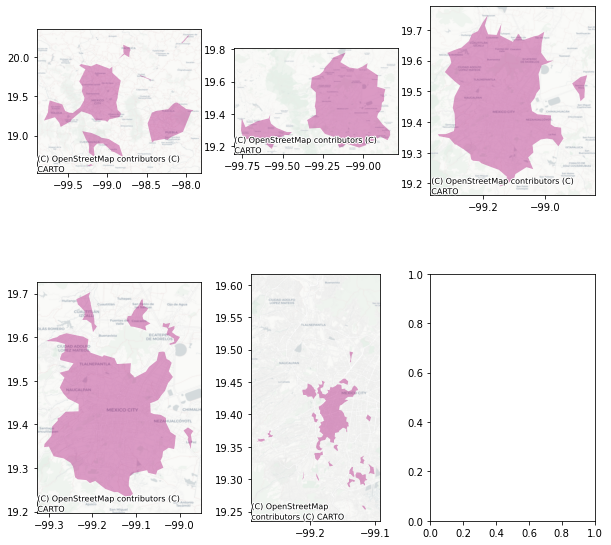

In [27]:
fig, axs = plt.subplots(2,3, figsize=(10,10))
axs = axs.ravel()

for num, level_s in enumerate(range(1,6)):
    print(level_s)
    get_map_geopandas_tree(axs[num], gpd_adapt_evening, level_s)

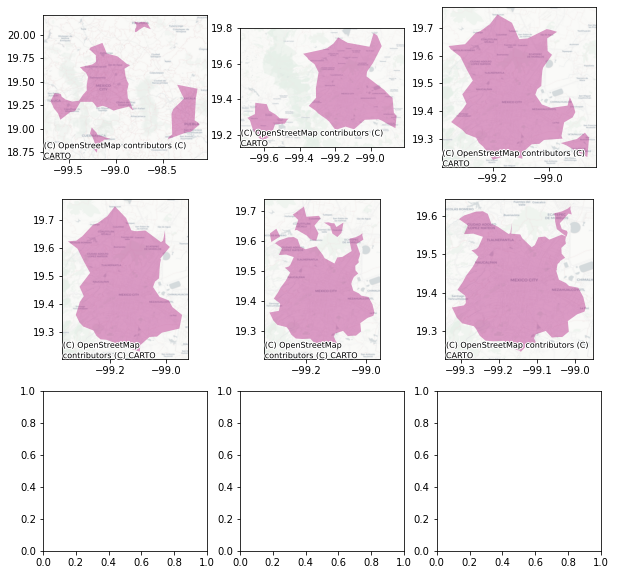

In [28]:
fig, axs = plt.subplots(3,3, figsize=(10,10))
axs = axs.ravel()

for num, level_s in enumerate(range(1,7)):
    # print(level_s)
    get_map_geopandas_tree(axs[num], gpd_adapt_afternoon, level_s)

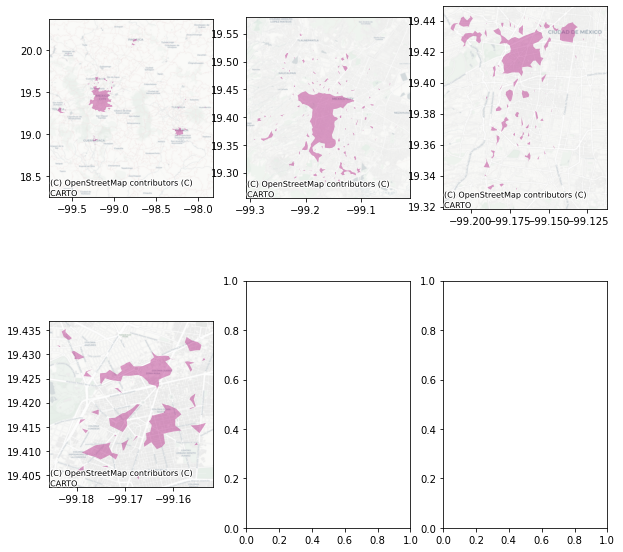

In [29]:
fig, axs = plt.subplots(2,3, figsize=(10,10))
axs = axs.ravel()

for num, level_s in enumerate(range(1,5)):
    # print(level_s)
    get_map_geopandas_tree(axs[num], gpd_Natural_afternoon, level_s)

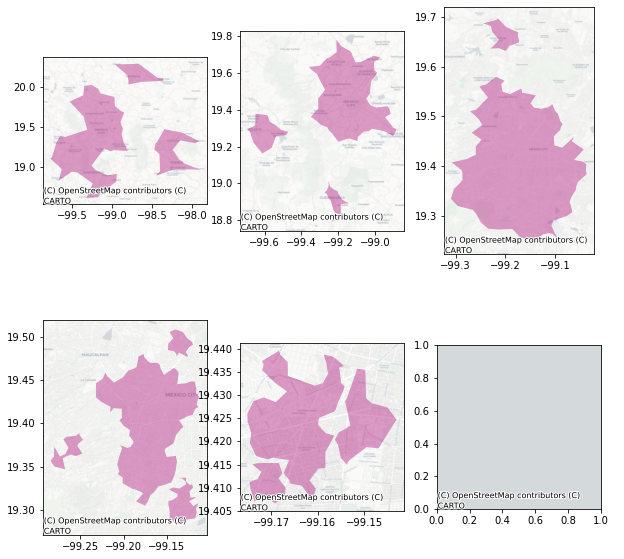

In [30]:
fig, axs = plt.subplots(2,3, figsize=(10,10))
axs = axs.ravel()

for num, level_s in enumerate(range(1,7)):
    # print(level_s)
    get_map_geopandas_tree(axs[num], gpd_DBSCAN_afternoon, level_s)

In [31]:
###### NO Borrar 

def recursive_clustering_tree_local(dic_points_ori, **kwargs):
    """
    Obtaing the recursive tree using a specific algorithm
    """
    levels_clustering= kwargs.get('levels_clustering',4)
    algorithm = kwargs.get('algorithm','dbscan')
    verbose = kwargs.get('verbose', False)
    cluster_tree = []
    recursive_clustering_local([dic_points_ori],  # Dictionary with Points
                levels_clustering,  # levels to process
                cluster_tree,  # to store the clusters
                level=0,  # current level
                **kwargs
                )
    
    tree_clus= Clustering.get_tree_from_clustering(cluster_tree)
    tree_from_clus= TreeClusters.TreeClusters()
    tree_from_clus.levels_nodes = tree_clus
    tree_from_clus.root= tree_from_clus.levels_nodes[0][0]
    return tree_from_clus

Transform the polygons and the "T" shape inco specific CRS


In [32]:
df_Zonas_metro_vis=  df_Zonas_metro.to_crs(gpd_adapt_afternoon.crs) 

In [33]:
df_manzanas_vis =  df_manzanas.to_crs(gpd_adapt_afternoon.crs) 

In [34]:
df_manzanas_500_vis = df_manzanas_500.to_crs(gpd_adapt_afternoon.crs)

In [148]:
def get_map_geopandas_tree( ax, geo_tree_polygons, level , color = '#AD0C78', alpha = 0.4, rasterized=False):
    """
    
    """
    
    max_ar_p = geo_tree_polygons[ geo_tree_polygons.level == level-1 ]['Polygon'].apply(lambda l: l.area).idxmax()
    polselec=geo_tree_polygons[( geo_tree_polygons.level == level) & (geo_tree_polygons.parent== geo_tree_polygons.iloc[max_ar_p]['name'])]
    polselec.plot(ax = ax, facecolor="none", edgecolor="black", rasterized=rasterized  )
    polselec.plot(ax = ax, alpha = alpha, color= color)

    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs = geo_tree_polygons.crs)
    return ax


## Secuencias

### Secuencia Adaptative

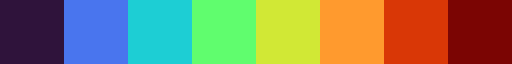

In [75]:
colors=  cm.get_cmap('turbo', 8)

colors

In [76]:
colors(1)

(0.27698, 0.46153, 0.93309, 1.0)

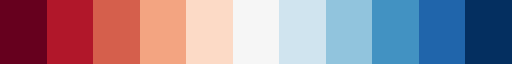

In [77]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
N=256
cmap = ListedColormap( [ (103/N,0/N,31/N,1), 
                        (178/N,24/N,43/N,1), 
                        (214/N,96/N,77/N,1), 
                        (244/N,165/N,130/N,1), 
                        (253/N,219/N,199/N,1), 
                        (247/N,247/N,247/N,1),
                        (209/N,229/N,240/N,1),
                        (146/N,197/N,222/N,1),
                        (67/N,147/N,195/N,1),
                        (33/N,102/N,172/N,1),
                        (5/N,48/N,97/N,1),
                       ])
cmap

In [78]:
cmap(6)

(0.81640625, 0.89453125, 0.9375, 1.0)

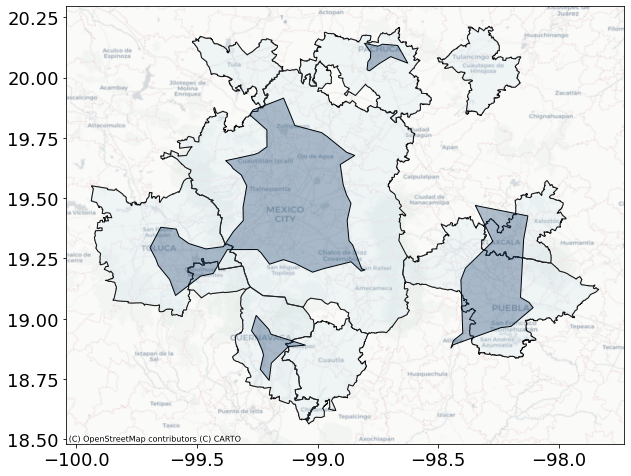

In [208]:
from matplotlib.patches import Patch
fig, axs = plt.subplots( figsize=(10,10))
df_Zonas_metro_vis[df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: 'M' in l )].plot(ax = axs , facecolor="none", edgecolor="black" , rasterized=True)
df_Zonas_metro_vis[df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: 'M' in l )].plot(ax = axs , facecolor= cmap(6), edgecolor="black" , alpha = 0.25, rasterized=True)
max_ar_p = gpd_adapt_afternoon[ gpd_adapt_afternoon.level == 0 ]['Polygon'].apply(lambda l: l.area).idxmax()
gpd_adapt_afternoon[(gpd_adapt_afternoon.level == 1) & (gpd_adapt_afternoon.parent== gpd_adapt_afternoon.iloc[max_ar_p]['name'])].plot(ax = axs,facecolor="none", edgecolor="black")
gpd_adapt_afternoon[(gpd_adapt_afternoon.level == 1) & (gpd_adapt_afternoon.parent== gpd_adapt_afternoon.iloc[max_ar_p]['name'])].plot(ax = axs, alpha=0.3, color=cmap(10) )
## magenta similar'#AD0C78'

ctx.add_basemap(axs, source=ctx.providers.CartoDB.Positron, crs = gpd_adapt_afternoon.crs)

# get_map_geopandas_tree(axs, gpd_adapt_afternoon, 1)
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)

# custom_leyend = [Patch(facecolor='gray', edgecolor='black',alpha= 0.25,
#                          label='Cities region'),
#                 Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='Adaptative')
#                 ]



# plt.legend(handles= custom_leyend,
#            ncol=2,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18,
#         frameon=False,
#           #title="LEGEND"
#           )
plt.show()
fig.savefig('../output/real_map0.pdf', dpi=700, bbox_inches='tight')
fig.savefig('../output/real_map0.png', dpi=700, bbox_inches='tight')
# fig.savefig('../output/real_map0_r.png', dpi=600, bbox_inches='tight', rasterize=True)
fig.savefig('../output/real_map0.jpg', dpi=700, bbox_inches='tight')

In [80]:
cdmx = df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: '09' in l )
edo = cdmx = df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: '15' in l )
cdmx_e = df_Zonas_metro_vis[ df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: ('15' in l or '09' in l) and ('M' in l) ) ]

# ctx.add_basemap(axs, source=ctx.providers.CartoDB.Positron, crs = gpd_adapt_afternoon.crs)


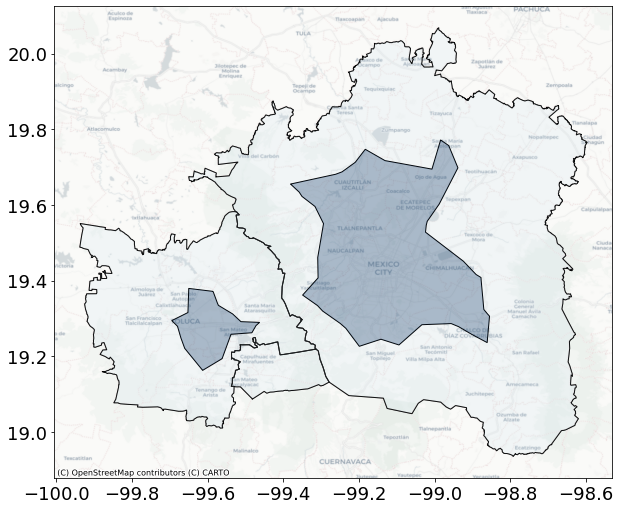

In [209]:
fig, axs = plt.subplots( figsize=(10,10))
cdmx_e.plot(ax = axs , facecolor="None", edgecolor="black" , rasterized=True)

cdmx_e.plot(ax = axs , facecolor=cmap(6), edgecolor="black" , alpha = 0.20, legend=True, rasterized=True)
max_ar_p = gpd_adapt_afternoon[ gpd_adapt_afternoon.level == 1 ]['Polygon'].apply(lambda l: l.area).idxmax()
gpd_adapt_afternoon[(gpd_adapt_afternoon.level == 2) & (gpd_adapt_afternoon.parent== gpd_adapt_afternoon.iloc[max_ar_p]['name'])].plot(ax = axs,facecolor="none", edgecolor="black")
gpd_adapt_afternoon[(gpd_adapt_afternoon.level == 2) & (gpd_adapt_afternoon.parent== gpd_adapt_afternoon.iloc[max_ar_p]['name'])].plot(ax = axs, alpha=0.3, color=cmap(10),rasterized=True )

ctx.add_basemap(axs, source=ctx.providers.CartoDB.Positron, crs = gpd_adapt_afternoon.crs)
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)
# custom_leyend = [Patch(facecolor='gray', edgecolor='black',alpha= 0.25,
#                          label='Cities region'),
#                 Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='Adaptative')
#                 ]
                
# plt.legend(handles= custom_leyend,
#            ncol=2,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18,
#         frameon=False,
#           #title="LEGEND"
#           )
fig.savefig('../output/real_map1.pdf', dpi=700, bbox_inches='tight')
fig.savefig('../output/real_map1.jpg', dpi=700, bbox_inches='tight')
fig.savefig('../output/real_map1.png', dpi=700, bbox_inches='tight')

In [82]:
qu = df_manzanas_500_vis['entropia'].quantile(q=[0,.2,.4,.6,.8,1.0])
Q1 = df_manzanas_500_vis[(df_manzanas_500_vis['entropia'] >= qu[0]) & (df_manzanas_500_vis['entropia'] < qu[0.2]) ]
Q2 = df_manzanas_500_vis[(df_manzanas_500_vis['entropia'] >= qu[0.2]) & (df_manzanas_500_vis['entropia'] < qu[0.4]) ]
Q3 = df_manzanas_500_vis[(df_manzanas_500_vis['entropia'] >= qu[0.4]) & (df_manzanas_500_vis['entropia'] < qu[0.6]) ]
Q4 = df_manzanas_500_vis[(df_manzanas_500_vis['entropia'] >= qu[0.6]) & (df_manzanas_500_vis['entropia'] < qu[0.8]) ]
Q5 = df_manzanas_500_vis[(df_manzanas_500_vis['entropia'] >= qu[0.8]) & (df_manzanas_500_vis['entropia'] < qu[1.0]) ]

In [83]:
min_x = -99.2979202
max_x = -99.0913358
min_y = 19.28441155
max_y = 19.52644345

In [84]:
custom_leyend[1].get_facecolor()

NameError: name 'custom_leyend' is not defined

In [ ]:
colors_map  = [colors(5),colors(6), colors(7)]

In [ ]:
from matplotlib.colors  import LinearSegmentedColormap
nodes = [0.2, 0.4, 0.8]
cmap1 = LinearSegmentedColormap.from_list("mycmap", colors_map)
cmap1_v=  cm.get_cmap(cmap1, 3)

In [ ]:

cmap1

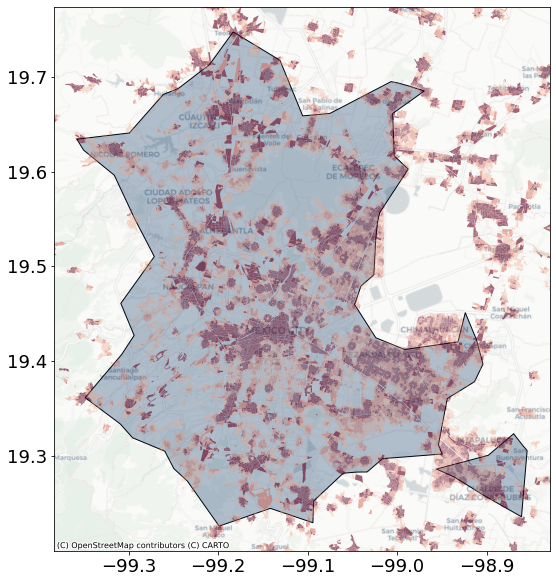

In [207]:
from matplotlib.collections import PatchCollection
import matplotlib.patches as mpatches
fig, axs = plt.subplots( figsize=(10, 10))
# cdmx_e = df_Zonas_metro_vis[ df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: ('09' in l) and ('M' in l) ) ]
# cdmx_e.plot(ax = axs , facecolor="gray", edgecolor="black" , alpha = 0.20)



# cmp =matplotlib.colors.ListedColormap(colors,5)
# Q1.plot(ax = axs, column= 'entropia' , color= colors(0), alpha= .4 )
get_map_geopandas_tree(axs, gpd_adapt_afternoon, 3, alpha= .3, color= cmap(10))

# max_ar_p = gpd_adapt_afternoon[ gpd_adapt_afternoon.level == 2 ]['Polygon'].apply(lambda l: l.area).idxmax()
# gpd_adapt_afternoon[(gpd_adapt_afternoon.level == 3) & (gpd_adapt_afternoon.parent== gpd_adapt_afternoon.iloc[max_ar_p]['name'])].plot(ax = axs, alpha=0.3, color='gray' )
Q1.plot(ax = axs, column= 'entropia' , color= cmap(0), alpha= .6 ,rasterized=True)
Q2.plot(ax = axs, column= 'entropia' , color= cmap(2), alpha= .5 ,rasterized=True)
Q3.plot(ax = axs, column= 'entropia' , color= cmap(3), alpha= .4 ,rasterized=True)

# Q4.plot(ax = axs, column= 'entropia' , color= colors(4), alpha= .4 )
# Q5.plot(ax = axs, column= 'entropia' , color= colors(3), alpha= .4 )
# ctx.add_basemap(axs, source=ctx.providers.CartoDB.Positron, crs = gpd_adapt_afternoon.crs)
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)

# custom_leyend_1 =  [mpatches.Patch(facecolor = colors(5),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(6),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(7),label='Job/Housing' , alpha= 0.4 ),
                 
#                  ] + [Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='Adaptative')] 
# plt.legend(handles= custom_leyend_1,
#            ncol=4,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18,
#         frameon=False,
#         labelspacing=.2,
#           #title="LEGEND"
#           )
fig.savefig('../output/real_map2.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map2.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map2.jpg', dpi=700,  bbox_inches='tight')

In [ ]:
fig, axs = plt.subplots( figsize=(10,20))
cdmx_e = df_Zonas_metro_vis[ df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: ('09' in l) and ('M' in l) ) ]
# cdmx_e.plot(ax = axs , facecolor="gray", edgecolor="black" , alpha = 0.20)
get_map_geopandas_tree(axs, gpd_adapt_afternoon, 3)
df_manzanas_500_vis.plot(ax = axs, column= 'entropia'  , scheme = 'Quantiles',cmap= 'summer', alpha= .4 )
custom_leyend =  [mpatches.Patch(facecolor =cmap1(b),label='Job/House' , alpha= 0.5 ) for b in nodes] + [Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
                         label='Adaptative')] 
axs.legend(handles= custom_leyend, 
        loc= 'upper left',
        fontsize=18,
        frameon=False,
        labelspacing=.5, 
          #title="LEGEND"
          )

# fig.savefig('../output/real_map2.pdf', dpi=600)

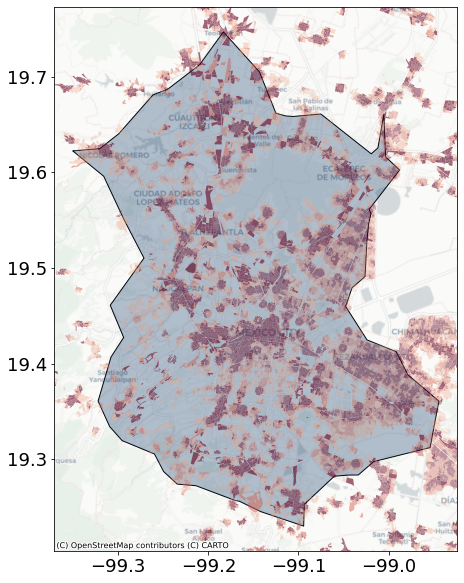

In [211]:
fig, axs = plt.subplots( figsize=(10, 10))
# cdmx_e = df_Zonas_metro_vis[ df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: ('09' in l) and ('M' in l) ) ]
# cdmx_e.plot(ax = axs , facecolor="gray", edgecolor="black" , alpha = 0.20)



# cmp =matplotlib.colors.ListedColormap(colors,5)

get_map_geopandas_tree(axs, gpd_adapt_afternoon, 4, alpha= .3, color= cmap(10))

# max_ar_p = gpd_adapt_afternoon[ gpd_adapt_afternoon.level == 2 ]['Polygon'].apply(lambda l: l.area).idxmax()
# gpd_adapt_afternoon[(gpd_adapt_afternoon.level == 3) & (gpd_adapt_afternoon.parent== gpd_adapt_afternoon.iloc[max_ar_p]['name'])].plot(ax = axs, alpha=0.3, color='gray' )
Q1.plot(ax = axs, column= 'entropia' , color= cmap(0), alpha= .6, rasterized=True)
Q2.plot(ax = axs, column= 'entropia' , color= cmap(2), alpha= .5, rasterized=True)
Q3.plot(ax = axs, column= 'entropia' , color= cmap(3), alpha= .4, rasterized=True)




# Q4.plot(ax = axs, column= 'entropia' , color= colors(4), alpha= .4 )
# Q5.plot(ax = axs, column= 'entropia' , color= colors(3), alpha= .4 )
# ctx.add_basemap(axs, source=ctx.providers.CartoDB.Positron, crs = gpd_adapt_afternoon.crs)
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)

# custom_leyend_1 =  [mpatches.Patch(facecolor = colors(5),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(6),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(7),label='Job/Housing' , alpha= 0.4 ),
                 
#                  ] + [Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='Adaptative')] 
# plt.legend(handles= custom_leyend_1,
#            ncol=4,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18,
#         frameon=False,
#         labelspacing=.2,
#           #title="LEGEND"
#           )



fig.savefig('../output/real_map3.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map3.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map3.jpg', dpi=700,  bbox_inches='tight')

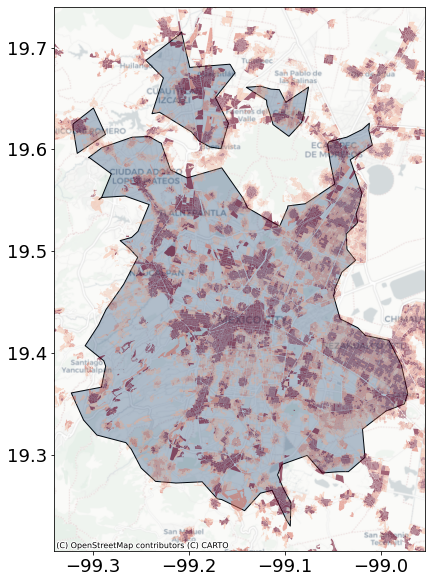

In [212]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_adapt_afternoon, 5, alpha= .3, color= cmap(10))

# max_ar_p = gpd_adapt_afternoon[ gpd_adapt_afternoon.level == 2 ]['Polygon'].apply(lambda l: l.area).idxmax()
# gpd_adapt_afternoon[(gpd_adapt_afternoon.level == 3) & (gpd_adapt_afternoon.parent== gpd_adapt_afternoon.iloc[max_ar_p]['name'])].plot(ax = axs, alpha=0.3, color='gray' )
Q1.plot(ax = axs, column= 'entropia' , color= cmap(0), alpha= .6, rasterized=True )
Q2.plot(ax = axs, column= 'entropia' , color= cmap(2), alpha= .5, rasterized=True )
Q3.plot(ax = axs, column= 'entropia' , color= cmap(3), alpha= .4, rasterized=True )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)
# custom_leyend_1 =  [mpatches.Patch(facecolor = colors(5),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(6),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(7),label='Job/Housing' , alpha= 0.4 ),
                 
#                  ] + [Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='Adaptative')] 
# plt.legend(handles= custom_leyend_1,
#            ncol=4,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18,
#         frameon=False,
#         labelspacing=.2,
#           #title="LEGEND"
#           )

fig.savefig('../output/real_map4.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map4.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map4.jpg', dpi=700,  bbox_inches='tight')

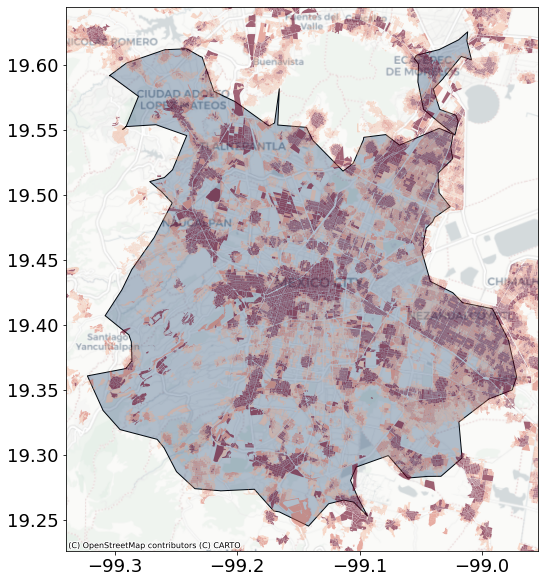

In [213]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_adapt_afternoon, 6, alpha= .3, color= cmap(10))
# max_ar_p = gpd_adapt_afternoon[ gpd_adapt_afternoon.level == 2 ]['Polygon'].apply(lambda l: l.area).idxmax()
# gpd_adapt_afternoon[(gpd_adapt_afternoon.level == 3) & (gpd_adapt_afternoon.parent== gpd_adapt_afternoon.iloc[max_ar_p]['name'])].plot(ax = axs, alpha=0.3, color='gray' )
Q1.plot(ax = axs, column= 'entropia' , color= cmap(0), alpha= .6 ,rasterized=True )
Q2.plot(ax = axs, column= 'entropia' , color= cmap(2), alpha= .5 ,rasterized=True )
Q3.plot(ax = axs, column= 'entropia' , color= cmap(3), alpha= .4 ,rasterized=True )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)
axs.set_xticks([-99.3, -99.2,-99.1,-99.0])

# custom_leyend_1 =  [mpatches.Patch(facecolor = colors(5),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(6),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(7),label='Job/Housing' , alpha= 0.4 ),
                 
#                  ] + [Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='Adaptative')] 
# plt.legend(handles= custom_leyend_1,
#            ncol=4,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18,
#         frameon=False,
#         labelspacing=.2,
#           #title="LEGEND"
#           )
fig.savefig('../output/real_map5.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map5.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map5.jpg', dpi=700,  bbox_inches='tight')

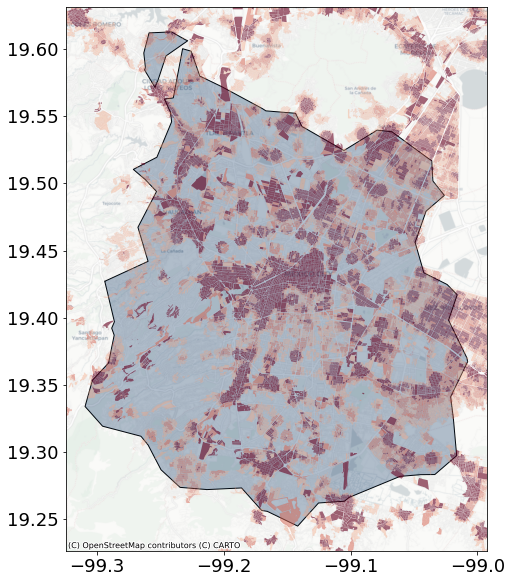

In [214]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_adapt_afternoon, 7, alpha= .3, color= cmap(10))
# max_ar_p = gpd_adapt_afternoon[ gpd_adapt_afternoon.level == 2 ]['Polygon'].apply(lambda l: l.area).idxmax()
# gpd_adapt_afternoon[(gpd_adapt_afternoon.level == 3) & (gpd_adapt_afternoon.parent== gpd_adapt_afternoon.iloc[max_ar_p]['name'])].plot(ax = axs, alpha=0.3, color='gray' )
Q1.plot(ax = axs, column= 'entropia' , color= cmap(0), alpha= .6, rasterized=True)
Q2.plot(ax = axs, column= 'entropia' , color= cmap(2), alpha= .5, rasterized=True)
Q3.plot(ax = axs, column= 'entropia' , color= cmap(3), alpha= .4, rasterized=True)
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)
axs.set_xticks([-99.3, -99.2,-99.1,-99.0])

# custom_leyend_1 =  [mpatches.Patch(facecolor = colors(5),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(6),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(7),label='Job/Housing' , alpha= 0.4 ),
                 
#                  ] + [Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='Adaptative')] 
# plt.legend(handles= custom_leyend_1,
#            ncol=4,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18,
#         frameon=False,
#         labelspacing=.2,
#           #title="LEGEND"
#           )

fig.savefig('../output/real_map6.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map6.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map6.jpg', dpi=700,  bbox_inches='tight')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


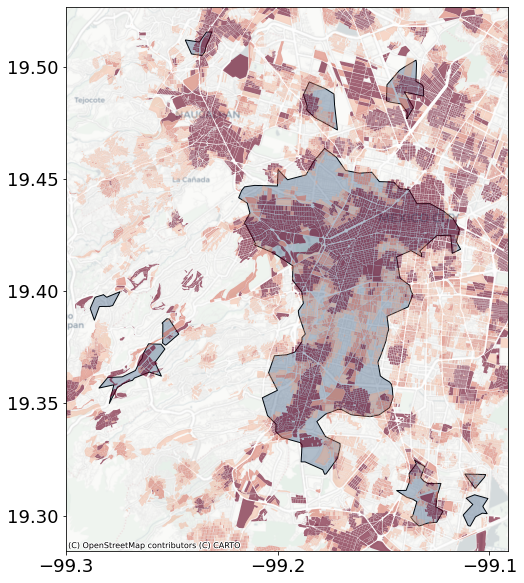

In [215]:
fig, axs = plt.subplots( figsize=(10, 10))

get_map_geopandas_tree(axs, gpd_adapt_afternoon, 8, alpha= .3, color= cmap(10))

# max_ar_p = gpd_adapt_afternoon[ gpd_adapt_afternoon.level == 2 ]['Polygon'].apply(lambda l: l.area).idxmax()
# gpd_adapt_afternoon[(gpd_adapt_afternoon.level == 3) & (gpd_adapt_afternoon.parent== gpd_adapt_afternoon.iloc[max_ar_p]['name'])].plot(ax = axs, alpha=0.3, color='gray' )
Q1.plot(ax = axs, column= 'entropia' , color= cmap(0), alpha= .6, rasterized=True)
Q2.plot(ax = axs, column= 'entropia' , color= cmap(2), alpha= .5, rasterized=True)
Q3.plot(ax = axs, column= 'entropia' , color= cmap(3), alpha= .4, rasterized=True)
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)
axs.set_xticks([-99.3, -99.2,-99.1])

# custom_leyend_1 =  [mpatches.Patch(facecolor = colors(5),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(6),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(7),label='Job/Housing' , alpha= 0.4 ),
                 
#                  ] + [Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='Adaptative')] 
# plt.legend(handles= custom_leyend_1,
#            ncol=4,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18,
#         frameon=False,
#         labelspacing=.2,
#           #title="LEGEND"
#           )
fig.savefig('../output/real_map7.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map7.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map7.jpg', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map7.svg', dpi=700,  bbox_inches='tight')
fig.savefig('../output/real_map7.eps', dpi=700,  bbox_inches='tight')

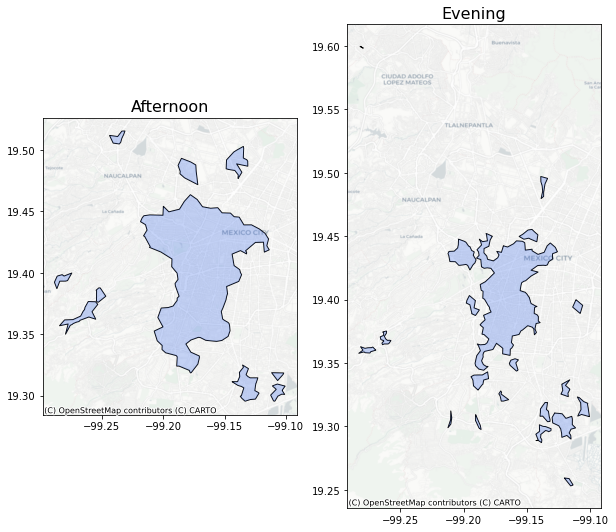

In [149]:
fig, axs = plt.subplots(1,2, figsize=(10,10))
axs = axs.ravel()

get_map_geopandas_tree(axs[0], gpd_adapt_afternoon, 8,alpha=0.3, color= colors(1))
axs[0].title.set_size(16)
axs[0].title.set_text('Afternoon')


get_map_geopandas_tree(axs[1], gpd_adapt_evening, 5, alpha=0.3, color= colors(1))
axs[1].title.set_size(16)
axs[1].title.set_text('Evening')

### Secuencia Natural

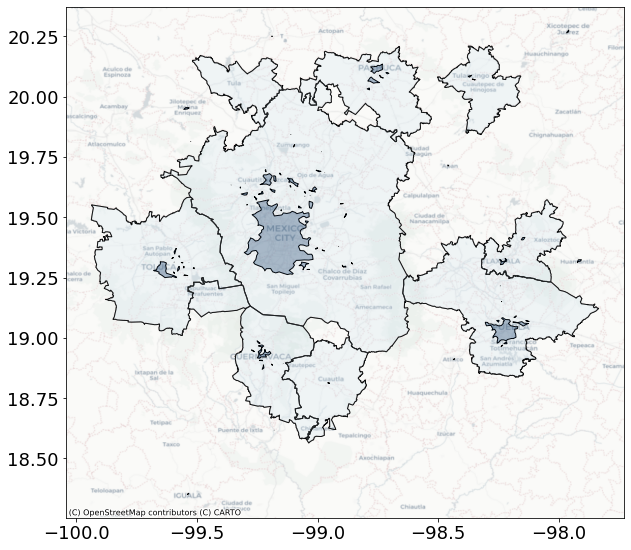

In [222]:
fig, axs = plt.subplots( figsize=(10, 10))
df_Zonas_metro_vis[df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: 'M' in l )].plot(ax = axs , facecolor="none", edgecolor="black")
df_Zonas_metro_vis[df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: 'M' in l )].plot(ax = axs , facecolor=cmap(6), edgecolor="black" , alpha = 0.25)
get_map_geopandas_tree(axs, gpd_Natural_afternoon, 1 ,alpha=0.3, color= cmap(10))
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)
# custom_leyend = [Patch(facecolor='gray', edgecolor='black',alpha= 0.25,
#                          label='Cities region'),
#                 Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='Natural Cities')
#                 ]
                
# plt.legend(handles= custom_leyend,
#            ncol=2,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18,
#         frameon=False,
#           #title="LEGEND"
#           )
fig.savefig('../output/secuencia_Natural_1.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/secuencia_Natural_1.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/secuencia_Natural_1.jpg', dpi=700,  bbox_inches='tight')

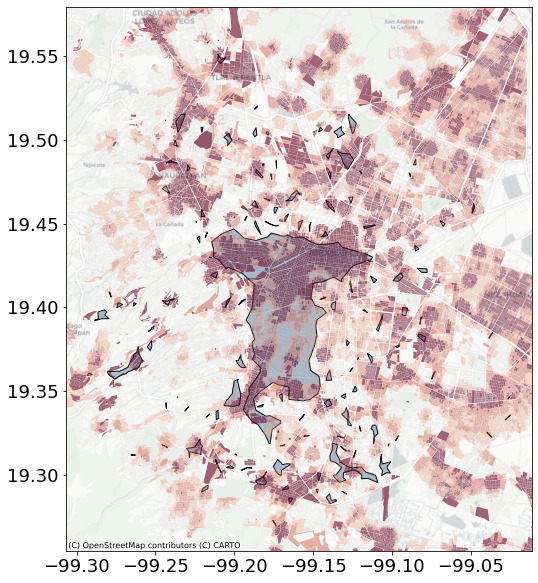

In [223]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_Natural_afternoon, 2, color = cmap(10), alpha= 0.3)
Q1.plot(ax = axs, column= 'entropia' , color= cmap(0), alpha= .6, rasterized=True )
Q2.plot(ax = axs, column= 'entropia' , color= cmap(2), alpha= .5, rasterized=True )
Q3.plot(ax = axs, column= 'entropia' , color= cmap(3), alpha= .4, rasterized=True )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)

# custom_leyend_1 =  [mpatches.Patch(facecolor = colors(5),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(6),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(7),label='Job/Housing' , alpha= 0.4 ),
                 
#                  ] + [Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='Natural Cities')] 
# plt.legend(handles= custom_leyend_1,
#            ncol=4,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18,
#         frameon=False,
#         labelspacing=.2,
#           #title="LEGEND"
#           )
fig.savefig('../output/secuencia_Natural_2.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/secuencia_Natural_2.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/secuencia_Natural_2.jpg', dpi=700,  bbox_inches='tight')

### Secuencia DBSCAN

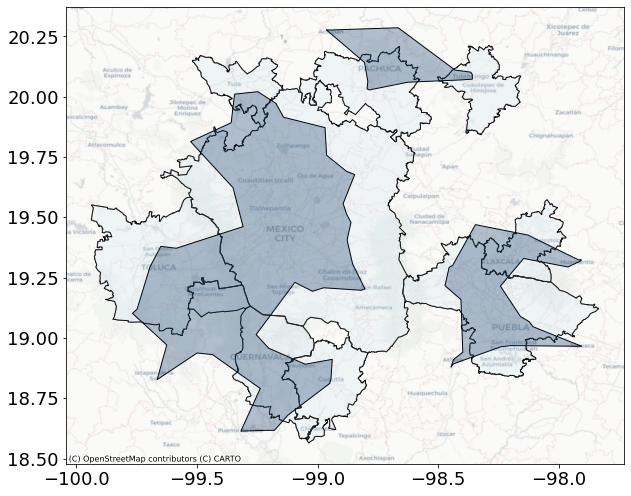

In [218]:
fig, axs = plt.subplots( figsize=(10, 10))
df_Zonas_metro_vis[df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: 'M' in l )].plot(ax = axs , facecolor="none", edgecolor="black",  rasterized=True)
df_Zonas_metro_vis[df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: 'M' in l )].plot(ax = axs , facecolor=cmap(6), edgecolor="black" , alpha = 0.25)
get_map_geopandas_tree(axs, gpd_DBSCAN_afternoon, 1, color = cmap(10), alpha = 0.3)
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)
# custom_leyend = [Patch(facecolor='gray', edgecolor='black',alpha= 0.25,
#                          label='Cities region'),
#                 Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='DBSCAN')
#                 ]
                
# plt.legend(handles= custom_leyend,
#            ncol=2,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize= 18,
#         frameon=False,
#           #title="LEGEND"
#           )
fig.savefig('../output/sec_DBSCAN_afternoon_1.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/sec_DBSCAN_afternoon_1.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/sec_DBSCAN_afternoon_1.jpg', dpi=700,  bbox_inches='tight')

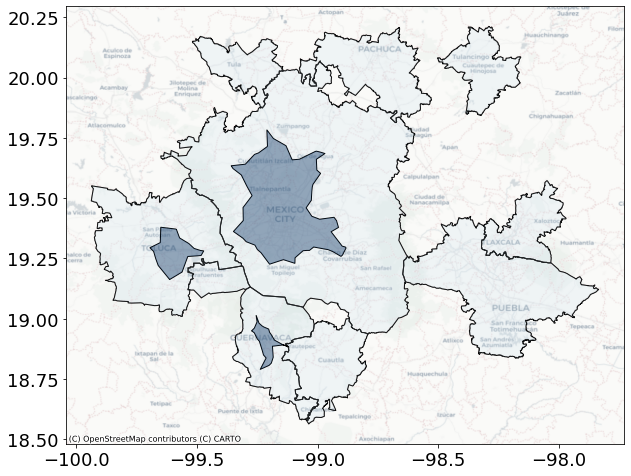

In [219]:
fig, axs = plt.subplots( figsize=(10, 10))
df_Zonas_metro_vis[df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: 'M' in l )].plot(ax = axs , facecolor="none", edgecolor="black",  rasterized=True )
df_Zonas_metro_vis[df_Zonas_metro_vis['CVE_SUN'].apply(lambda l: 'M' in l )].plot(ax = axs , facecolor=cmap(6), edgecolor="black" , alpha = 0.25)
get_map_geopandas_tree(axs, gpd_DBSCAN_afternoon, 2, color= cmap(10))
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)
# custom_leyend = [Patch(facecolor='gray', edgecolor='black',alpha= 0.25,
#                          label='Cities region'),
#                 Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='DBSCAN')
#                 ]
                
# plt.legend(handles= custom_leyend,
#            ncol=2,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18 ,
#         frameon=False,
#           #title="LEGEND"
#           )
fig.savefig('../output/sec_DBSCAN_afternoon_2.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/sec_DBSCAN_afternoon_2.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/sec_DBSCAN_afternoon_2.jpg', dpi=700,  bbox_inches='tight')

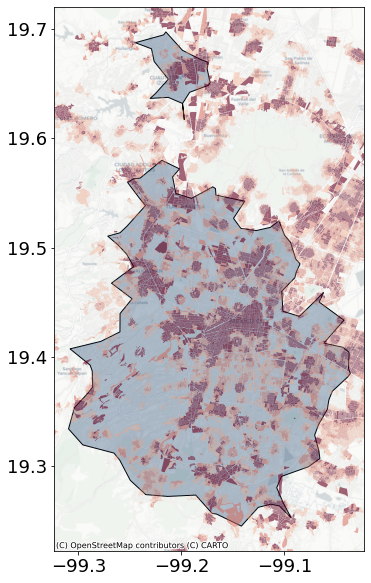

In [220]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_DBSCAN_afternoon, 3, alpha= 0.3, color = cmap(10))
Q1.plot(ax = axs, column= 'entropia' , color= cmap(0), alpha= .6, rasterized=True )
Q2.plot(ax = axs, column= 'entropia' , color= cmap(2), alpha= .5, rasterized=True )
Q3.plot(ax = axs, column= 'entropia' , color= cmap(3), alpha= .4, rasterized=True )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)
# custom_leyend_1 =  [mpatches.Patch(facecolor = colors(5),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(6),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(7),label='Job/Housing' , alpha= 0.4 ),
                 
#                  ] + [Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='DBSCAN')] 
# plt.legend(handles= custom_leyend_1,
#            ncol=4,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize= 18,
#         frameon=False,
#         labelspacing=.2,
#           #title="LEGEND"
#           )
fig.savefig('../output/sec_DBSCAN_afternoon_3.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/sec_DBSCAN_afternoon_3.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/sec_DBSCAN_afternoon_3.jpg', dpi=700,  bbox_inches='tight')

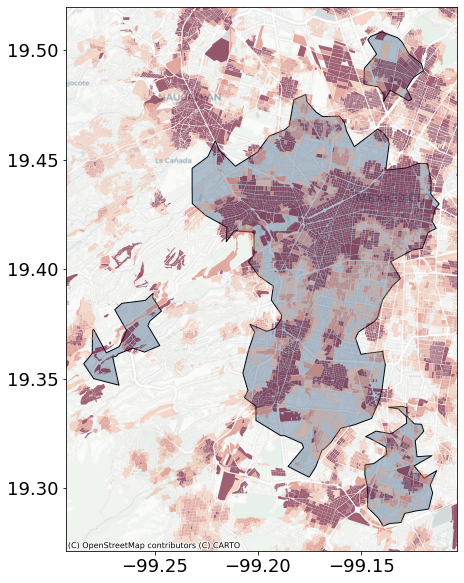

In [221]:
fig, axs = plt.subplots( figsize=(10, 10))
get_map_geopandas_tree(axs, gpd_DBSCAN_afternoon, 4, alpha= 0.3, color = cmap(10))
Q1.plot(ax = axs, column= 'entropia' , color= cmap(0), alpha= .6, rasterized=True )
Q2.plot(ax = axs, column= 'entropia' , color= cmap(2), alpha= .5, rasterized=True )
Q3.plot(ax = axs, column= 'entropia' , color= cmap(3), alpha= .4, rasterized=True )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18)
# custom_leyend_1 =  [mpatches.Patch(facecolor = colors(5),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(6),label='' , alpha= 0.4 ),
#                     mpatches.Patch(facecolor = colors(7),label='Job/Housing' , alpha= 0.4 ),
                 
#                  ] + [Patch(facecolor = colors(1), edgecolor='black',alpha= 0.3,
#                          label='DBSCAN')] 
# plt.legend(handles= custom_leyend_1,
#            ncol=4,
#         bbox_to_anchor=(.5, 1.1),
#         loc=9,
#         fontsize=18,
#         frameon=False,
#         labelspacing=.2,
#           #title="LEGEND"
#           )
fig.savefig('../output/sec_DBSCAN_afternoon_4.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/sec_DBSCAN_afternoon_4.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/sec_DBSCAN_afternoon_4.jpg', dpi=700,  bbox_inches='tight')

### Evening Afternoon Matriz

In [ ]:
fig, axs = plt.subplots(3,2, figsize=(10,10))
axs = axs.ravel()
#### Natural 
get_map_geopandas_tree(axs[0], gpd_Natural_afternoon, 2)
get_map_geopandas_tree(axs[1], gpd_Natural_evening, 2)
###DBSCAN
get_map_geopandas_tree(axs[2], gpd_DBSCAN_afternoon, 4)
get_map_geopandas_tree(axs[3], gpd_DBSCAN_evening, 4)

## Adaptative
get_map_geopandas_tree(axs[4], gpd_adapt_afternoon, 8)
get_map_geopandas_tree(axs[5], gpd_adapt_evening, 5)


axs[0].title.set_size(16)
axs[0].title.set_text('Afternoon')
axs[1].title.set_size(16)
axs[1].title.set_text('Evening')





In [ ]:
fig, axs = plt.subplots(2,3, figsize=(15,10))
axs = axs.ravel()
#### Natural 
get_map_geopandas_tree(axs[0], gpd_Natural_afternoon, 2, color=colors(1), alpha= 0.3)
get_map_geopandas_tree(axs[3], gpd_Natural_evening, 2, color=colors(1), alpha= 0.3)
###DBSCAN
get_map_geopandas_tree(axs[1], gpd_DBSCAN_afternoon, 4, color=colors(1), alpha= 0.3)
get_map_geopandas_tree(axs[4], gpd_DBSCAN_evening, 5, color=colors(1), alpha= 0.3)
## Adaptative
get_map_geopandas_tree(axs[2], gpd_adapt_afternoon, 8, color=colors(1), alpha= 0.3)
get_map_geopandas_tree(axs[5], gpd_adapt_evening, 5, color=colors(1), alpha= 0.3)

xmin,xmax = axs[2].get_xlim()
ymin,ymax = axs[2].get_ylim()

print(xmin,xmax)
axs[0].set_ylim( ymin,ymax)
axs[0].set_xlim( xmin,xmax)
axs[1].set_ylim( ymin,ymax)
axs[1].set_xlim( xmin,xmax)
axs[4].set_ylim( ymin,ymax)
axs[4].set_xlim( xmin,xmax)
axs[3].set_ylim( ymin,ymax)
axs[3].set_xlim( xmin,xmax)
axs[5].set_ylim( ymin,ymax)
axs[5].set_xlim( xmin,xmax)

###### if is larger
# ctx.add_basemap(axs[4], source=ctx.providers.OpenStreetMap.Mapnik, crs = gpd_DBSCAN_evening.crs)

# Axs 0
Q1.plot(ax = axs[0], column= 'entropia' , color= colors(7), alpha= .45, rasterized=True)
Q2.plot(ax = axs[0], column= 'entropia' , color= colors(6), alpha= .40, rasterized=True)
Q3.plot(ax = axs[0], column= 'entropia' , color= colors(5), alpha= .35, rasterized=True)
# Axsi 1
Q1.plot(ax = axs[1], column= 'entropia' , color= colors(7), alpha= .45, rasterized=True)
Q2.plot(ax = axs[1], column= 'entropia' , color= colors(6), alpha= .40, rasterized=True)
Q3.plot(ax = axs[1], column= 'entropia' , color= colors(5), alpha= .35, rasterized=True)
# Axsi 2
Q1.plot(ax = axs[2], column= 'entropia' , color= colors(7), alpha= .45, rasterized=True)
Q2.plot(ax = axs[2], column= 'entropia' , color= colors(6), alpha= .40, rasterized=True)
Q3.plot(ax = axs[2], column= 'entropia' , color= colors(5), alpha= .35, rasterized=True)
# Axsi 3
Q1.plot(ax = axs[3], column= 'entropia' , color= colors(7), alpha= .45, rasterized=True)
Q2.plot(ax = axs[3], column= 'entropia' , color= colors(6), alpha= .40, rasterized=True)
Q3.plot(ax = axs[3], column= 'entropia' , color= colors(5), alpha= .35, rasterized=True)
# Axsi 4
Q1.plot(ax = axs[4], column= 'entropia' , color= colors(7), alpha= .45, rasterized=True)
Q2.plot(ax = axs[4], column= 'entropia' , color= colors(6), alpha= .40, rasterized=True)
Q3.plot(ax = axs[4], column= 'entropia' , color= colors(5), alpha= .35, rasterized=True)
# Axsi 5
Q1.plot(ax = axs[5], column= 'entropia' , color= colors(7), alpha= .45, rasterized=True)
Q2.plot(ax = axs[5], column= 'entropia' , color= colors(6), alpha= .40, rasterized=True)
Q3.plot(ax = axs[5], column= 'entropia' , color= colors(5), alpha= .35, rasterized=True)



axs[0].title.set_size(18)
axs[0].title.set_text('Natural Cities')
axs[1].title.set_size(18)
axs[1].title.set_text('DBSCAN')
axs[2].title.set_size(18)
axs[2].title.set_text('Adaptative DBSCAN')

axs[0].set_ylabel("Evening", fontsize=18)
axs[3].set_ylabel("Afternoon", fontsize=18)
# fig.savefig('../output/Evening_afternoon.pdf', dpi=600)

In [ ]:
xmin,xmax

In [ ]:

ymin,ymax

In [174]:
def final_image(ax,
                df_algo,
                df_manza,
                **kwargs
               ):
    """Obtain the images from the level
    """
    level = kwargs.get('level', 1)
    colors_relevant = kwargs.get('colors_relevant', cm.get_cmap('turbo', 8))
    colors_relevant_dic = kwargs.get('colors_relevant_dic', None)
    color_df_algo = kwargs.get('color_df_algo' , colors_relevant(1))
    alpha_df_algo = kwargs.get('alpha_df_algo' , 0.3)
    alpha_qua = kwargs.get('alpha_qua' , 0.6)
    relevant= kwargs.get('relevant', [0,1,2,3])
    x_min = kwargs.get('min_x',-99.2979202)
    x_max = kwargs.get('max_x', -99.0913358)
    y_min = kwargs.get('min_y', 19.28441155)
    y_max = kwargs.get('max_y', 19.52644345) 
    list_quant = kwargs.get('list_quant', [0,.2,.4,.6,.8,1.0])
    rasterized_quant = kwargs.get('rasterized_quant', False)
    
    
    print(level)
#     max_ar_p = df_algo[ df_algo.level == level-1 ]['Polygon'].apply(lambda l: l.area).idxmax()
#     polselec = df_algo[( df_algo.level == level) & (df_algo.parent== df_algo.iloc[max_ar_p]['name'])]
#     print(type(polselec))
#     polselec.plot(ax = ax, facecolor="none", edgecolor="black" )
#     polselec.plot(ax = ax, alpha = alpha, color= color)

#     ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs = df_algo.crs)
    
    axs.set_ylim( y_min,y_max)
    axs.set_xlim( x_min,x_max)
    get_map_geopandas_tree(axs, df_algo, level = level, color = color_df_algo, alpha = alpha_df_algo)
    
    qu = df_manza['entropia'].quantile(q=list_quant)
    Q_i=[]
    for num, qu_i in enumerate(qu.values[:-1]):
        print(qu_i)
        Q_i.append(df_manza[(df_manza['entropia'] >= qu_i) & (df_manza['entropia'] < qu.values[num+1]) ])
    print(len(Q_i))
    for num, i in enumerate(relevant):
        print(colors_relevant(num))
        if colors_relevant_dic == None:
            Q_i[num].plot(ax = ax, column= 'entropia',
                          color= colors_relevant(8-1-num),
                          alpha= alpha_qua,
                          rasterized = rasterized_quant)
        else:
            Q_i[num].plot(ax = ax, column= 'entropia',
                          color= colors_relevant_dic[num],
                          alpha= alpha_qua,
                          rasterized = rasterized_quant
                         )
    
    # ax.yticks(fontsize=24)
    return ax
    

In [175]:
colors_rele= {0:cmap(0),1:cmap(1),2:cmap(2),3:cmap(3)}

2
-0.78796403708
-0.292167479138
-0.242769620292
-0.20218010453800003
-0.158153722088
5
(0.18995, 0.07176, 0.23217, 1.0)
(0.27698, 0.46153, 0.93309, 1.0)
(0.10738, 0.81381, 0.83484, 1.0)
(0.38127, 0.98909, 0.42386, 1.0)


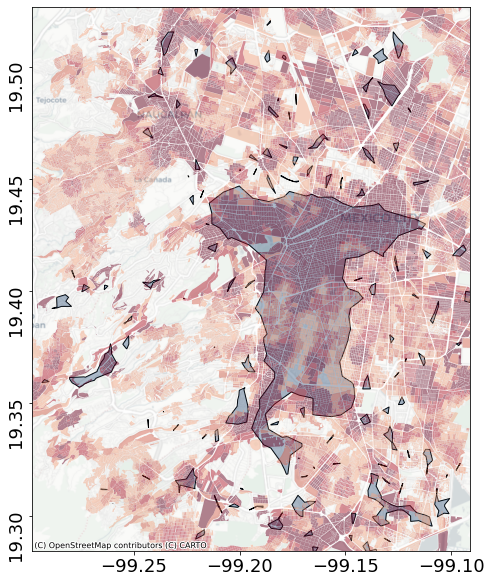

In [176]:
fig, axs = plt.subplots( figsize=(8,10))
# axs = axs.ravel()

color_algo =cmap(10)
# get_map_geopandas_tree(axs, gpd_Natural_afternoon, 2, color=colors(1), alpha= 0.3)

# get_map_geopandas_tree(axs, gpd_Natural_afternoon, level = 1, color = colors(1), alpha = 0.3)
axs=  final_image(axs,
                  gpd_Natural_afternoon,
                  df_manzanas_500_vis,
                  level= 2,
                  colors_relevant_dic = colors_rele,
                  color_df_algo = cmap(10),
                  relevant=[0,1,2,3],
                  alpha_df_algo =  0.33,
                  alpha_qua = .47,
                  rasterized_quant = True,
                 )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18, rotation=90)

2
-0.78796403708
-0.292167479138
-0.242769620292
-0.20218010453800003
-0.158153722088
5
(0.18995, 0.07176, 0.23217, 1.0)
(0.27698, 0.46153, 0.93309, 1.0)
(0.10738, 0.81381, 0.83484, 1.0)
(0.38127, 0.98909, 0.42386, 1.0)


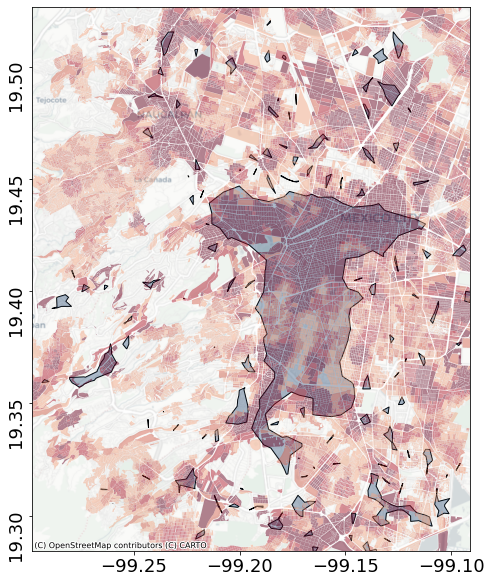

In [198]:
fig, axs = plt.subplots( figsize=(8,10))
# axs = axs.ravel()

color_algo =colors(1)
# get_map_geopandas_tree(axs, gpd_Natural_afternoon, 2, color=colors(1), alpha= 0.3)

# get_map_geopandas_tree(axs, gpd_Natural_afternoon, level = 1, color = colors(1), alpha = 0.3)
axs=  final_image(axs,
                  gpd_Natural_afternoon,
                  df_manzanas_500_vis,
                  level= 2,
                  colors_relevant_dic = colors_rele,
                  relevant=[0,1,2,3],
                  color_df_algo = cmap(10),
                  alpha_df_algo =  0.33,
                  alpha_qua = .47,
                  rasterized_quant = True,
                 )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18, rotation=90)

fig.savefig('../output/Evening_afternoon_00.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_00.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_00.jpg', dpi=700,  bbox_inches='tight')

2
-0.78796403708
-0.292167479138
-0.242769620292
-0.20218010453800003
-0.158153722088
5
(0.18995, 0.07176, 0.23217, 1.0)
(0.27698, 0.46153, 0.93309, 1.0)
(0.10738, 0.81381, 0.83484, 1.0)
(0.38127, 0.98909, 0.42386, 1.0)


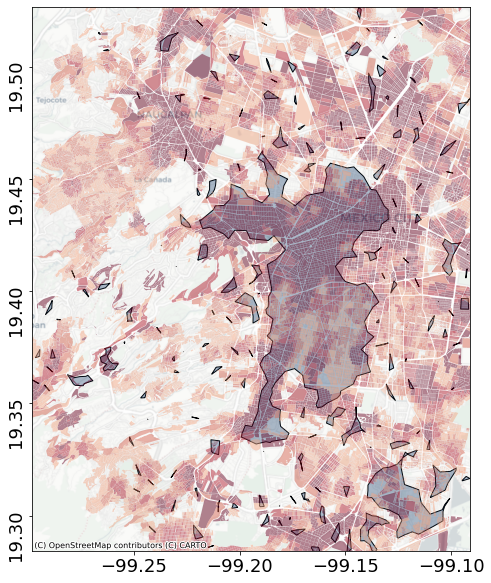

In [199]:
fig, axs = plt.subplots( figsize=(8,10))
# axs = axs.ravel()

color_algo =colors(1)
# get_map_geopandas_tree(axs, gpd_Natural_afternoon, 2, color=colors(1), alpha= 0.3)

# get_map_geopandas_tree(axs, gpd_Natural_afternoon, level = 1, color = colors(1), alpha = 0.3)
axs=  final_image(axs,
                  gpd_Natural_evening,
                  df_manzanas_500_vis,
                  level= 2,
                  colors_relevant_dic = colors_rele,
                  relevant=[0,1,2,3],
                  color_df_algo = cmap(10),
                  alpha_df_algo =  0.33,
                  alpha_qua = .47,
                  rasterized_quant = True,
                 )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18, rotation=90)

fig.savefig('../output/Evening_afternoon_10.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_10.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_10.jpg', dpi=700,  bbox_inches='tight')

4
-0.78796403708
-0.292167479138
-0.242769620292
-0.20218010453800003
-0.158153722088
5
(0.18995, 0.07176, 0.23217, 1.0)
(0.27698, 0.46153, 0.93309, 1.0)
(0.10738, 0.81381, 0.83484, 1.0)
(0.38127, 0.98909, 0.42386, 1.0)


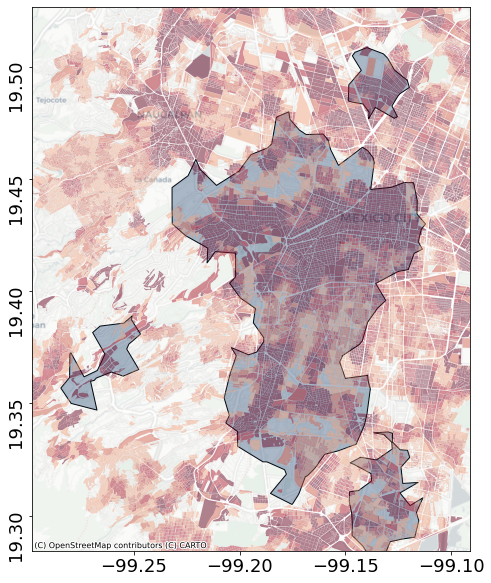

In [200]:
fig, axs = plt.subplots( figsize=(8,10))
# axs = axs.ravel()

color_algo =colors(1)
# get_map_geopandas_tree(axs, gpd_Natural_afternoon, 2, color=colors(1), alpha= 0.3)

# get_map_geopandas_tree(axs, gpd_Natural_afternoon, level = 1, color = colors(1), alpha = 0.3)
axs=  final_image(axs,
                  gpd_DBSCAN_afternoon,
                  df_manzanas_500_vis,
                  level= 4,
                  colors_relevant_dic = colors_rele,
                  relevant=[0,1,2,3],
                  color_df_algo = cmap(10),
                  alpha_df_algo =  0.33,
                  alpha_qua = .47,
                  rasterized_quant = True,
                 )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18, rotation=90)

fig.savefig('../output/Evening_afternoon_01.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_01.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_01.jpg', dpi=700,  bbox_inches='tight')

5
-0.78796403708
-0.292167479138
-0.242769620292
-0.20218010453800003
-0.158153722088
5
(0.18995, 0.07176, 0.23217, 1.0)
(0.27698, 0.46153, 0.93309, 1.0)
(0.10738, 0.81381, 0.83484, 1.0)
(0.38127, 0.98909, 0.42386, 1.0)


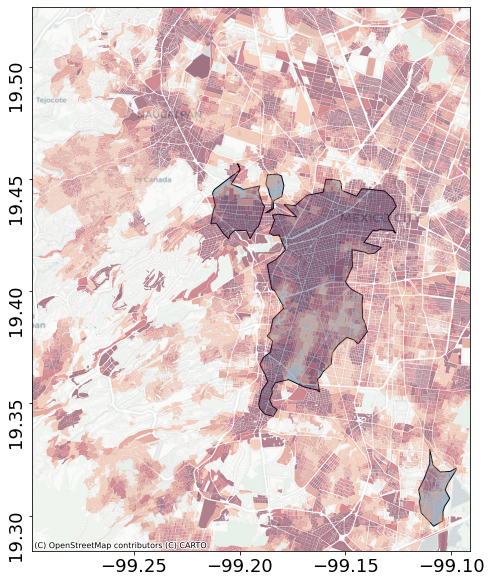

In [201]:
fig, axs = plt.subplots( figsize=(8,10))
# axs = axs.ravel()

color_algo =colors(1)
# get_map_geopandas_tree(axs, gpd_Natural_afternoon, 2, color=colors(1), alpha= 0.3)

# get_map_geopandas_tree(axs, gpd_Natural_afternoon, level = 1, color = colors(1), alpha = 0.3)
axs=  final_image(axs,
                  gpd_DBSCAN_evening,
                  df_manzanas_500_vis,
                  level= 5,
                  colors_relevant_dic = colors_rele,
                  relevant=[0,1,2,3],
                  color_df_algo = cmap(10),
                  alpha_df_algo =  0.33,
                  alpha_qua = .47,
                  rasterized_quant = True,
                 )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18, rotation=90)

fig.savefig('../output/Evening_afternoon_11.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_11.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_11.jpg', dpi=700,  bbox_inches='tight')

8
-0.78796403708
-0.292167479138
-0.242769620292
-0.20218010453800003
-0.158153722088
5
(0.18995, 0.07176, 0.23217, 1.0)
(0.27698, 0.46153, 0.93309, 1.0)
(0.10738, 0.81381, 0.83484, 1.0)
(0.38127, 0.98909, 0.42386, 1.0)


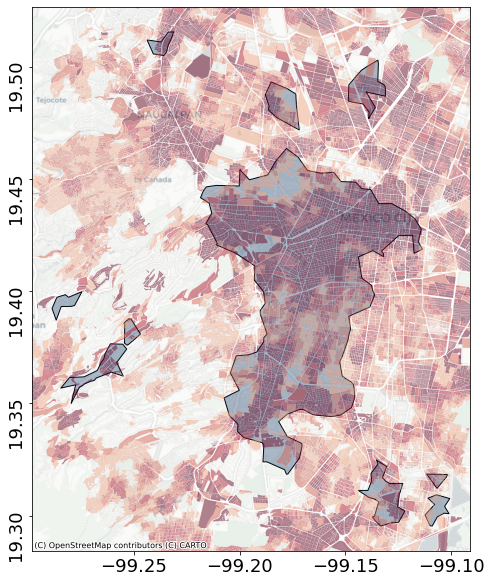

In [202]:
fig, axs = plt.subplots( figsize=(8,10))
# axs = axs.ravel()

color_algo =colors(1)
# get_map_geopandas_tree(axs, gpd_Natural_afternoon, 2, color=colors(1), alpha= 0.3)

# get_map_geopandas_tree(axs, gpd_Natural_afternoon, level = 1, color = colors(1), alpha = 0.3)
axs=  final_image(axs,
                  gpd_adapt_afternoon,
                  df_manzanas_500_vis,
                  level= 8,
                  colors_relevant_dic = colors_rele,
                  relevant=[0,1,2,3],
                  color_df_algo = cmap(10),
                  alpha_df_algo =  0.33,
                  alpha_qua = .47,
                  rasterized_quant = True,
                 )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18, rotation=90)

fig.savefig('../output/Evening_afternoon_02.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_02.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_02.jpg', dpi=700,  bbox_inches='tight')

5
-0.78796403708
-0.292167479138
-0.242769620292
-0.20218010453800003
-0.158153722088
5
(0.18995, 0.07176, 0.23217, 1.0)
(0.27698, 0.46153, 0.93309, 1.0)
(0.10738, 0.81381, 0.83484, 1.0)
(0.38127, 0.98909, 0.42386, 1.0)


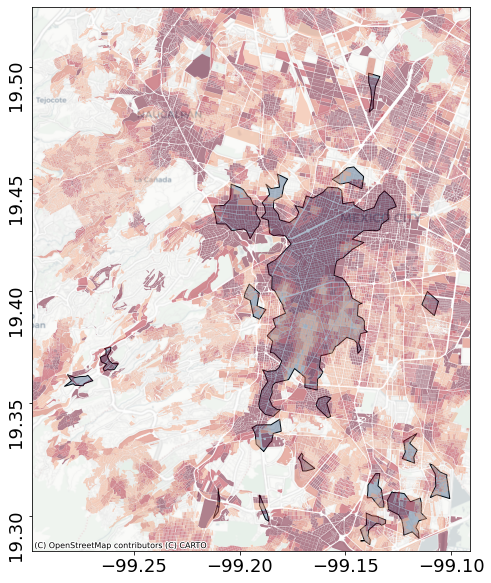

In [203]:
fig, axs = plt.subplots( figsize=(8,10))
# axs = axs.ravel()

color_algo =colors(1)
# get_map_geopandas_tree(axs, gpd_Natural_afternoon, 2, color=colors(1), alpha= 0.3)

# get_map_geopandas_tree(axs, gpd_Natural_afternoon, level = 1, color = colors(1), alpha = 0.3)
axs=  final_image(axs,
                  gpd_adapt_evening,
                  df_manzanas_500_vis,
                  level= 5,
                  colors_relevant_dic = colors_rele,
                  relevant=[0,1,2,3],
                  color_df_algo = cmap(10),
                  alpha_df_algo =  0.33,
                  alpha_qua = .47,
                  rasterized_quant = True,
                 )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18, rotation=90)

fig.savefig('../output/Evening_afternoon_12.pdf', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_12.png', dpi=700,  bbox_inches='tight')
fig.savefig('../output/Evening_afternoon_12.jpg', dpi=700,  bbox_inches='tight')

2
-0.78796403708
-0.292167479138
-0.242769620292
-0.20218010453800003
-0.158153722088
5
(0.18995, 0.07176, 0.23217, 1.0)
(0.27698, 0.46153, 0.93309, 1.0)
(0.10738, 0.81381, 0.83484, 1.0)
(0.38127, 0.98909, 0.42386, 1.0)


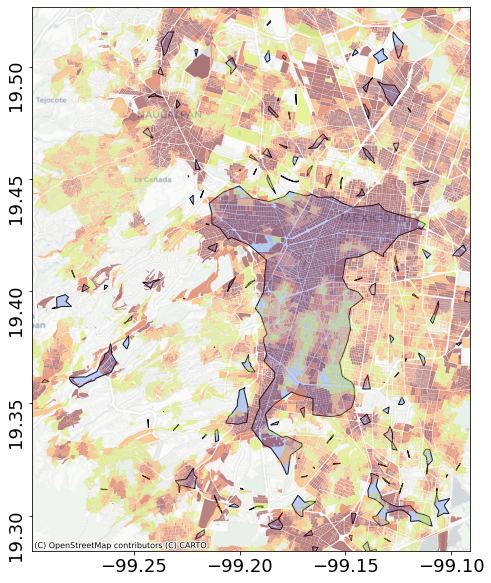

In [204]:
fig, axs = plt.subplots( figsize=(8,10))
# axs = axs.ravel()

color_algo =colors(1)
# get_map_geopandas_tree(axs, gpd_Natural_afternoon, 2, color=colors(1), alpha= 0.3)

# get_map_geopandas_tree(axs, gpd_Natural_afternoon, level = 1, color = colors(1), alpha = 0.3)
axs=  final_image(axs,
                  gpd_Natural_afternoon,
                  df_manzanas_500_vis,
                  level= 2,
                  alpha_df_algo =  0.33,
                  alpha_qua = .47
                 )
axs.tick_params(axis = 'x', which = 'major', labelsize = 18)
axs.tick_params(axis = 'y', which = 'major', labelsize = 18, rotation=90)

# fig.savefig('../output/Evening_afternoon_00.pdf', dpi=600,  bbox_inches='tight')

In [205]:
import subprocess
def gs_opt(filename, fileout):
    filenameTmp = filename.split('.')[-2]+ '_tmp.pdf'
    gs = ['gs',
          '-sDEVICE=pdfwrite',
          '-dEmbedAllFonts=false',
          '-dSubsetFonts=true',             # Create font subsets (default)
          '-dPDFSETTINGS=/prepress',        # Image resolution
          '-dDetectDuplicateImages=true',   # Embeds images used multiple times only once
          '-dCompressFonts=true',           # Compress fonts in the output (default)
          '-dNOPAUSE',                      # No pause after each image
          '-dQUIET',                        # Suppress output
          '-dBATCH',                        # Automatically exit
          '-sOutputFile='+filenameTmp,      # Save to temporary output
          filename]                         # Input file

    subprocess.run(gs)                                      # Create temporary file
    # subprocess.run(['del', filename],shell=True)            # Delete input file
    subprocess.run(['ren',filenameTmp, fileout],shell=True) # Rename temporary to input file


In [206]:
gs_opt('../output/Evening_afternoon.pdf','../output/Evening_afternoon_reduce.pdf' )

GPL Ghostscript 9.50: **** Could not open the file /output/Evening_afternoon_tmp.pdf .
**** Unable to open the initial device, quitting.
/output/Evening_afternoon_tmp.pdf: 1: ren: not found
